# THIS CODE CONCATENATES WITH INVERSE VAR WEIGHTING

In [23]:
from astropy.table import Table, vstack, Column, MaskedColumn, pprint
import numpy as np

import matplotlib 
import matplotlib.pyplot as plt
from astropy.convolution import convolve, Gaussian1DKernel

from astropy.io import fits
from matplotlib.backends.backend_pdf import PdfPages

import os
import requests
import sys
sys.path.append('/Users/s2537809/DESI/desispec/py')
sys.path.append('/Users/s2537809/DESI/desimodel/py')
sys.path.append('/Users/s2537809/DESI/desitarget/py')
sys.path.append('/Users/s2537809/DESI/desiutil/py')

#from desispec.io import read_spectra
# import DESI related modules - 
from desimodel.footprint import radec2pix      # For getting healpix values
import desispec.io                             # Input/Output functions related to DESI spectra
from desispec import coaddition                # Functions related to coadding the spectra


from scipy import interpolate
import astropy.units as u
path='/Users/s2537809/Documents/DESI-STACKING'#specify code directory
os.chdir(path)
import stack_code as sc
import importlib
import fnmatch
import extinction as ext
from scipy.optimize import curve_fit
from astropy.coordinates import SkyCoord
from astropy.modeling import models
from astropy.table import Table
from matplotlib import gridspec
import spectres
import time
import warnings

#pip install lmfit, extinction, sfdmap, spectres

import pandas as pd
crossmatch = Table.read('crossmatch_classifications.fits', format = 'fits' )

In [24]:
""" 
Remove the objects with failed redshfit classifications.
First appplying their ZWARN flag, then with the photo-z quality flag.
"""

# Apply ZWARN Flag cut
crossmatch = crossmatch[crossmatch['ZWARN'] == 0]

# Create photo-z quality flag
crossmatch['Z_CHECK']= (crossmatch['Z']-crossmatch['Z_BEST_1'])/(1+crossmatch['Z'])
crossmatch['Z_FAILURE'] = 0  
crossmatch['Z_FAILURE'][abs(crossmatch['Z_CHECK']) > 0.1] = 1 

# Apply photo-z quality flag
crossmatch = crossmatch[crossmatch['Z_FAILURE'] == 0]
print(len(crossmatch))
print(len(crossmatch[crossmatch['Z'] < 0]))




# Remove objects with no SFR or Mass
crossmatch = crossmatch[crossmatch['SFR_cons'] != -99]
crossmatch = crossmatch[crossmatch['Mass_cons'] != -99] 

# Calculate sSFR
crossmatch['sSFR_cons'] = crossmatch['SFR_cons']/crossmatch['Mass_cons']

7533
27


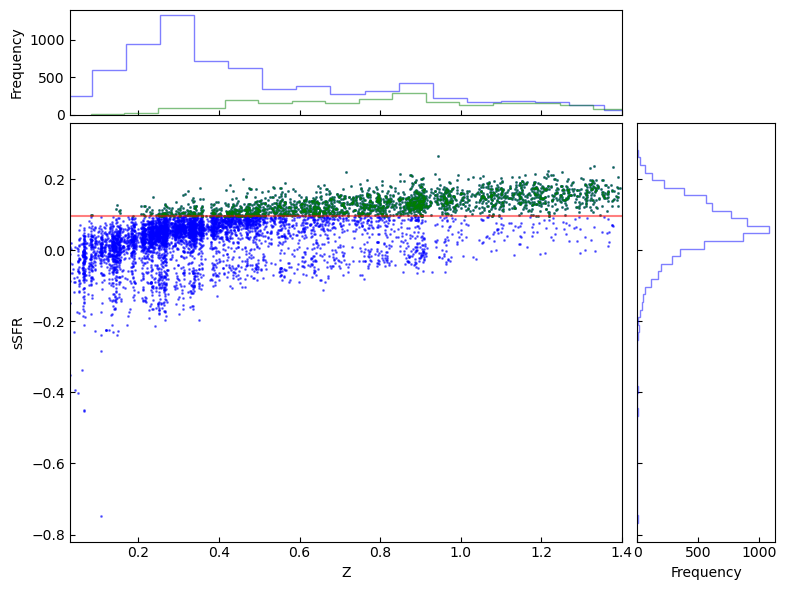

<Figure size 640x480 with 0 Axes>

In [56]:
# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)



"""
# Plot sSFR vs Z
plt.scatter(crossmatch['Z'], crossmatch['sSFR_cons'],color = 'blue', s=1)
plt.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], color='green', s=1)
plt.axhline(y=sSFR_percentile, color='r', linestyle='-')
plt.xlabel('Z')
plt.xlim(0.03,1.4)
plt.ylabel('sSFR')
plt.yscale('log')
plt.title('SFG')
plt.show()

"""


import matplotlib.gridspec as gridspec

# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)

# Create a 2x2 grid layout
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 4], width_ratios=[4, 1])

# Scatter plot
ax_scatter = plt.subplot(gs[1, 0])
ax_scatter.scatter(crossmatch['Z'], crossmatch['sSFR_cons'], color='blue', s=1, alpha = 0.5)
ax_scatter.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], color='green', s=1, alpha = 0.5)
ax_scatter.axhline(y=sSFR_percentile, color='r', linestyle='-', alpha = 0.5)
ax_scatter.set_xlabel('Z')
ax_scatter.set_xlim(0.03, 1.4)
ax_scatter.set_ylabel('sSFR')
#ax_scatter.set_yscale('log')
ax_scatter.tick_params(direction='in')

# Histogram of Z
ax_hist_z = fig.add_subplot(gs[0, 0], sharex=ax_scatter)
ax_hist_z.hist(crossmatch['Z'], bins=50, color='blue', orientation='vertical', alpha=0.5, histtype='step')
ax_hist_z.hist(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='green', orientation='vertical', alpha=0.5, histtype='step')
ax_hist_z.set_ylabel('Frequency')
ax_hist_z.tick_params(direction='in')

# Histogram of sSFR
ax_hist_sSFR = fig.add_subplot(gs[1, 1], sharey=ax_scatter)
ax_hist_sSFR.hist(crossmatch['sSFR_cons'], bins=50, color='blue', orientation='horizontal', alpha=0.5, histtype='step')
#ax_hist_sSFR.hist(crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='green', orientation='horizontal', alpha=0.5, histtype='step')
ax_hist_sSFR.set_xlabel('Frequency')
ax_hist_sSFR.tick_params(direction='in')

# Remove empty subplot
fig.delaxes(plt.subplot(gs[0, 1]))

# Remove space between subplots
plt.setp(ax_hist_z.get_xticklabels(), visible=False)
plt.setp(ax_hist_sSFR.get_yticklabels(), visible=False)
fig.tight_layout(h_pad=0, w_pad=0)
plt.show()


plt.tight_layout()
plt.show()


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1486/1539163723.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=0, w_pad=0)


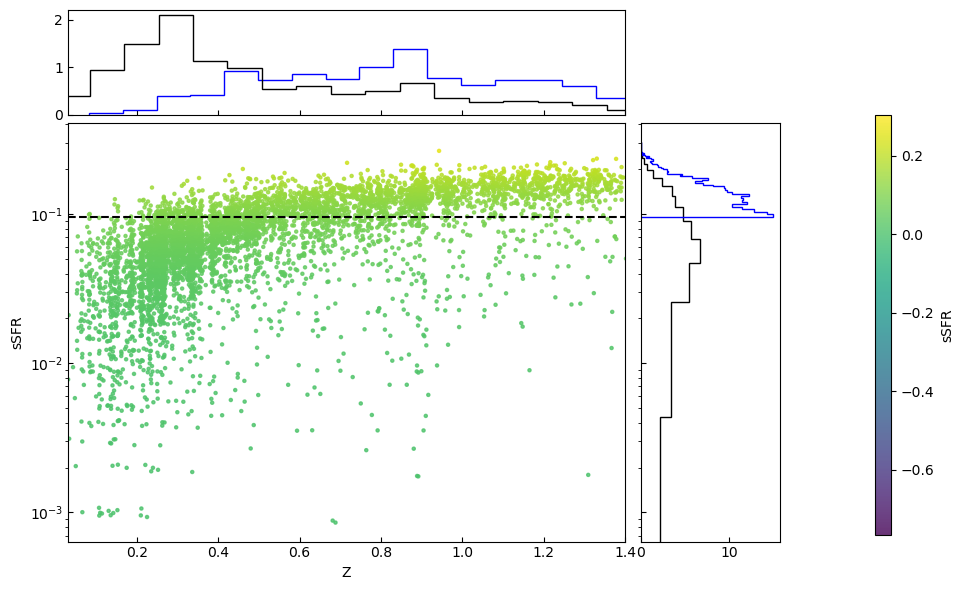

<Figure size 640x480 with 0 Axes>

In [85]:
# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)



"""
# Plot sSFR vs Z
plt.scatter(crossmatch['Z'], crossmatch['sSFR_cons'],color = 'blue', s=1)
plt.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], color='green', s=1)
plt.axhline(y=sSFR_percentile, color='r', linestyle='-')
plt.xlabel('Z')
plt.xlim(0.03,1.4)
plt.ylabel('sSFR')
plt.yscale('log')
plt.title('SFG')
plt.show()

"""


import matplotlib.gridspec as gridspec

# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)

# Create a 2x2 grid layout
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 4], width_ratios=[4, 1])

# Scatter plot
ax_scatter = plt.subplot(gs[1, 0])
scatter1 = ax_scatter.scatter(crossmatch['Z'], crossmatch['sSFR_cons'],  c=crossmatch['sSFR_cons'], s=5, alpha = 0.8)
#scatter = ax_scatter.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], c=crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], cmap='viridis', s=5, alpha=0.8)
ax_scatter.axhline(y=sSFR_percentile, color='black', linestyle='--', alpha = 1)
ax_scatter.set_xlabel('Z')
ax_scatter.set_xlim(0.03, 1.4)
ax_scatter.set_yscale('log')
#ax_scatter.set_ylim(-0.3,0.3)
ax_scatter.set_ylabel('sSFR')
ax_scatter.tick_params(direction='in')

# Add colorbar
cbar_ax = fig.add_axes([1.1, 0.1, 0.02, 0.7])  # [left, bottom, width, height]
cbar = plt.colorbar(scatter1, cax=cbar_ax)
cbar.set_label('sSFR')

# Histogram of Z
ax_hist_z = fig.add_subplot(gs[0, 0], sharex=ax_scatter)
ax_hist_z.hist(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='blue', orientation='vertical', alpha=1, histtype='step', density = True, stacked=True)
ax_hist_z.hist(crossmatch['Z'], bins=50, color='black', orientation='vertical', alpha=1, histtype='step', density = True, stacked=True)
#ax_hist_z.set_ylabel('')
ax_hist_z.tick_params(direction='in')

# Histogram of sSFR
ax_hist_sSFR = fig.add_subplot(gs[1, 1], sharey=ax_scatter)
ax_hist_sSFR.hist(crossmatch['sSFR_cons'], bins=50, color='black', orientation='horizontal', alpha=1, histtype='step', density = True, stacked=True)
ax_hist_sSFR.hist(crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='blue', orientation='horizontal', alpha=1, histtype='step', density=True, stacked=True)
#ax_hist_sSFR.set_xlabel('Frequency')
ax_hist_sSFR.tick_params(direction='in')

# Remove empty subplot
fig.delaxes(plt.subplot(gs[0, 1]))

# Remove space between subplots
plt.setp(ax_hist_z.get_xticklabels(), visible=False)
plt.setp(ax_hist_sSFR.get_yticklabels(), visible=False)
fig.tight_layout(h_pad=0, w_pad=0)
plt.show()


plt.tight_layout()
plt.show()


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1486/3284104176.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=0, w_pad=0)


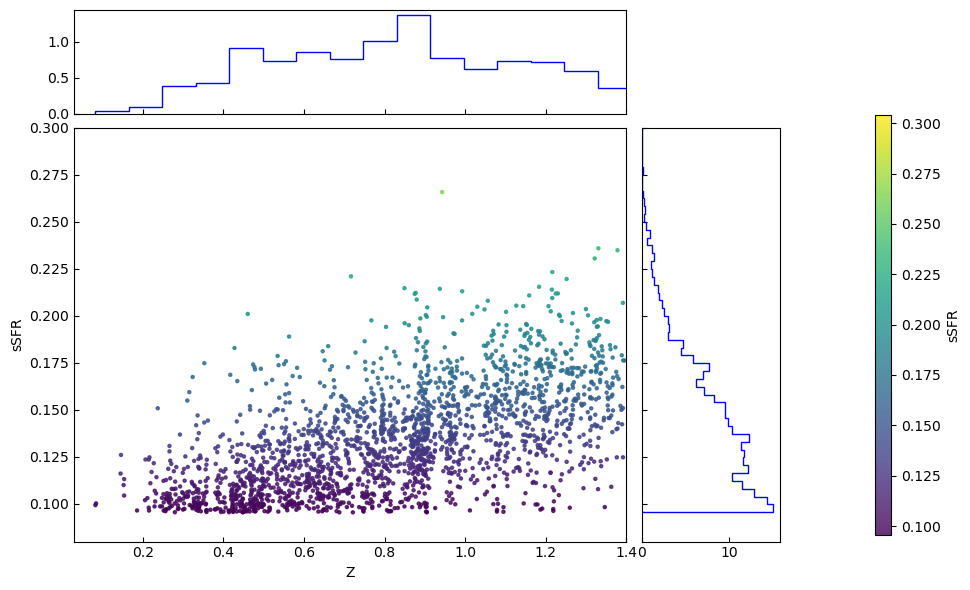

<Figure size 640x480 with 0 Axes>

In [91]:
# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)



"""
# Plot sSFR vs Z
plt.scatter(crossmatch['Z'], crossmatch['sSFR_cons'],color = 'blue', s=1)
plt.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], color='green', s=1)
plt.axhline(y=sSFR_percentile, color='r', linestyle='-')
plt.xlabel('Z')
plt.xlim(0.03,1.4)
plt.ylabel('sSFR')
plt.yscale('log')
plt.title('SFG')
plt.show()

"""


import matplotlib.gridspec as gridspec

# Sort data by sSFR
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

# Find the upper third percentile of sSFR
percentile = 66
sSFR_percentile = np.percentile(crossmatch[f'{var_bin}'], percentile)

# Create a 2x2 grid layout
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 4], width_ratios=[4, 1])

# Scatter plot
ax_scatter = plt.subplot(gs[1, 0])
scatter = ax_scatter.scatter(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], c=crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], cmap='viridis', s=5, alpha=0.8)
ax_scatter.set_xlabel('Z')
ax_scatter.set_xlim(0.03, 1.4)
#ax_scatter.set_yscale('log')
ax_scatter.set_ylim(0.08,0.3)
ax_scatter.set_ylabel('sSFR')
ax_scatter.tick_params(direction='in')

# Add colorbar
cbar_ax = fig.add_axes([1.1, 0.1, 0.02, 0.7])  # [left, bottom, width, height]
cbar = plt.colorbar(scatter, cax=cbar_ax)
cbar.set_label('sSFR')

# Histogram of Z
ax_hist_z = fig.add_subplot(gs[0, 0], sharex=ax_scatter)
ax_hist_z.hist(crossmatch['Z'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='blue', orientation='vertical', alpha=1, histtype='step', density = True, stacked=True)
#ax_hist_z.hist(crossmatch['Z'], bins=50, color='black', orientation='vertical', alpha=1, histtype='step', density = True, stacked=True)
#ax_hist_z.set_ylabel('')
ax_hist_z.tick_params(direction='in')

# Histogram of sSFR
ax_hist_sSFR = fig.add_subplot(gs[1, 1], sharey=ax_scatter)
#ax_hist_sSFR.hist(crossmatch['sSFR_cons'], bins=50, color='black', orientation='horizontal', alpha=1, histtype='step', density = True, stacked=True)
ax_hist_sSFR.hist(crossmatch['sSFR_cons'][crossmatch['sSFR_cons'] >= sSFR_percentile], bins=50, color='blue', orientation='horizontal', alpha=1, histtype='step', density=True, stacked=True)
#ax_hist_sSFR.set_xlabel('Frequency')
ax_hist_sSFR.tick_params(direction='in')

# Remove empty subplot
fig.delaxes(plt.subplot(gs[0, 1]))

# Remove space between subplots
plt.setp(ax_hist_z.get_xticklabels(), visible=False)
plt.setp(ax_hist_sSFR.get_yticklabels(), visible=False)
fig.tight_layout(h_pad=0, w_pad=0)
plt.show()


plt.tight_layout()
plt.show()


## Cell below verifies if Spectra are downloaded and downloads if they aren't

Only run if unsure if spectra are downloaded, to save time!

In [2]:
"""
Note: The lengths for indexing are:

HERG = 184

RQAGN = 814

LERG = 1293

SFG = 6294

"""


Overall_class = 'SFG'
my_table = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][1000:1200]
search_column_name = 'TARGETID'
search_values = np.array(my_table[f'{search_column_name}'])



def select_data(table, column_name, search_values):
    # Get the column data as a numpy array
    column_data = table[column_name]

    SURVEY = []
    PROGRAM = []
    HEALPIX = []
    n_values = []
    Z = []
    

    for search_value in search_values:
        # Find the indices where the condition is met (value == search_value)
        indices = np.where(column_data == search_value)[0]


        if len(indices) > 0:
            # Find the corresponding Survey, program, healpix, and Z values
            SURVEY.append(table['SURVEY'][indices[0]])
            PROGRAM.append(table['PROGRAM'][indices[0]])
            HEALPIX.append(table['HEALPIX'][indices[0]])
            Z.append(table['Z'][indices[0]])
            HEALPIX_str = str(table['HEALPIX'][indices[0]])
            n_str = HEALPIX_str[:3]
            n_values.append(int(n_str))
        else:
            # Handle the case where the search value was not found
            SURVEY.append(None)
            PROGRAM.append(None)
            HEALPIX.append(None)
            n_values.append(None)
            Z.append(None)
    

    return np.array(SURVEY), np.array(PROGRAM), np.array(HEALPIX), np.array(n_values), np.array(Z), 


SURVEY = select_data(my_table, search_column_name, search_values)[0]
PROGRAM = select_data(my_table, search_column_name, search_values)[1]
HEALPIX = select_data(my_table, search_column_name, search_values)[2]
n = select_data(my_table, search_column_name, search_values)[3]
Z = select_data(my_table, search_column_name, search_values)[4]
print (SURVEY,PROGRAM,HEALPIX, n, Z)

for n, survey, program, healpix, Z, search_value in zip(n, SURVEY, PROGRAM, HEALPIX, Z, search_values):
        #download the file from the given Target ID
        target_url = f"https://data.desi.lbl.gov/public/edr/spectro/redux/fuji/healpix/{survey}/{program}/{n}/{healpix}/coadd-{survey}-{program}-{healpix}.fits"
        
        # Define the folder name and file name
        folder_name = 'DESI_Downloads'
        file_name = f"coadd-{survey}-{program}-{healpix}.fits"
        print(search_value)


        # Check if the folder exists, and create it if it doesn't
        if not os.path.exists(folder_name):
            os.makedirs(folder_name)

        # Check if the file exists in the folder
        file_path = os.path.join(folder_name, file_name)
        if os.path.exists(file_path):
            print(f"{file_name} already exists in {folder_name}. No need to download.")
        else:
            # File doesn't exist, download it
            try:
                response = requests.get(target_url)
                if response.status_code == 200:
                    with open(file_path, 'wb') as file:
                        file.write(response.content)
                    print(f"{file_name} downloaded to {folder_name}.")
                else:
                    print(f"Failed to download {file_name}. Status code: {response.status_code}")
            except Exception as e:
                print(f"An error occurred while downloading {file_name}: {str(e)}")

      

['sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv3' 'sv3'
 'sv3' 'sv1' 'sv1' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv3' 'sv1' 'sv1'
 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv1' 'sv1'
 'sv1' 'sv3' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv1' 'sv3'
 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3'
 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3'
 'sv1' 'sv3' 'sv3' 'sv1' 'sv1' 'sv1' 'sv1' 'sv1' 'sv3' 'sv1' 'sv3' 'sv3'
 'sv1' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv1' 'sv1' 'sv3' 'sv3' 'sv1'
 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3'
 'sv1' 'sv3' 'sv1' 'sv3' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3' 'sv3'
 'sv1' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv1' 'sv1' 'sv3'
 'sv1' 'sv3' 'sv3' 'sv1' 'sv3' 'sv3' 'sv1' 'sv3' 'sv1' 'sv1' 'sv1' 'sv3'
 'sv1' 'sv3' 'sv1' 'sv3' 'sv3' 'sv3' 'sv1' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3'
 'sv1' 'sv1' 'sv3' 'sv3' 'sv3' 'sv3' 'sv1' 'sv3' 's

# Wavelength Overlap Regions Weighted Average

In [92]:
def inv_var_weighted_average(flux1, ivar1, flux2, ivar2):
    """
    Finds the inverse varience weighted average of two flux spectra
    
    """
    weight1 = 1 / ivar1
    weight2 = 1 / ivar2
    total_weight = weight1 + weight2
    weighted_flux1 = flux1 * (weight1 / total_weight)
    weighted_flux2 = flux2 * (weight2 / total_weight)
    weighted_avg = weighted_flux1 + weighted_flux2
    return weighted_avg

def no_overlap_f(waveb,fluxb,waver,fluxr,wavez,fluxz):
    """
    Isolates the flux and wavelength arrays of each band to non-overlapping wavelength sections
    
    """
    new_b_length = np.where(waveb<waver[0])
    b_wave = waveb[new_b_length]
    b_flux = fluxb[new_b_length]
    new_r_length = np.where((waver>waveb[-1])&(waver<wavez[0]))
    r_wave = waver[new_r_length]
    r_flux = fluxr[new_r_length]
    new_z_length = np.where(wavez>waver[-1])
    z_wave = wavez[new_z_length]
    z_flux = fluxz[new_z_length]

    return b_wave,b_flux,r_wave,r_flux,z_wave,z_flux


def overlap_av(wave1,wave2,flux1,flux2,ivar1,ivar2):
    """
    Finds the overlap of two wavelength ranges.
    Computes the inverse var weighted average flux and wavelength for th eoverlapping range 
    
    """
    overlap_idx_1 = np.where(wave1 >= wave2[0]) 
    overlap_wave = wave1[overlap_idx_1]
    overlap_flux_1 = flux1[overlap_idx_1]
    overlap_ivar_1 = ivar1[overlap_idx_1]

    overlap_idx_2 = np.where(wave2 <= wave1[-1]) 
    overlap_flux_2 = flux2[overlap_idx_2]
    overlap_ivar_2 = ivar2[overlap_idx_2]
    
    overlap_av_flux = inv_var_weighted_average(overlap_flux_1,overlap_ivar_1,overlap_flux_2,overlap_ivar_2)

    return overlap_av_flux, overlap_wave

# Stacking Functions 

In [5]:
#stacking functions

# Ignore warnings due to spec_var=0
warnings.filterwarnings("ignore", message="divide by zero encountered in true_divide")


def get_spectra(table, column_name, search_values): 
    print('Number of spectra =', len(table))
    # Get the Target IDs as a numpy array
    column_data = table[column_name]

    SURVEY, PROGRAM, HEALPIX, n_values = [], [], [], []
    Z, RA, DEC, Source_ID = [], [], [], []


    for search_value in search_values:
        # Find the indices where the condition is met (value == search_value)
        # This is only relevant if input is doen by search value and not selected table
        indices = np.where(column_data == search_value)[0]

        if len(indices) > 0:
            # Find the corresponding Survey, program, healpix, Z , RA and Dec values
            SURVEY.append(table['SURVEY'][indices[0]])
            PROGRAM.append(table['PROGRAM'][indices[0]])
            HEALPIX.append(table['HEALPIX'][indices[0]])
            Z.append(table['Z'][indices[0]])
            RA.append(table['TARGET_RA'][indices[0]]) 
            DEC.append(table['TARGET_DEC'][indices[0]])
            Source_ID.append(table['TARGETID'][indices[0]])
            HEALPIX_str = str(table['HEALPIX'][indices[0]])
            n_str = HEALPIX_str[:3]
            n_values.append(int(n_str))
        else:
            # Handle the case where the search value was not found
            SURVEY.append(None)
            PROGRAM.append(None)
            HEALPIX.append(None)
            n_values.append(None)
            Z.append(None)   
            RA.append(None)
            DEC.append(None)
            Source_ID.append(None)
            
    
    z = np.array(Z)
    RA = np.array(RA)
    DEC = np.array(DEC)
    id_spec = np.array(Source_ID)
    wave_spec, flux_spec, sigma_spec = [], [], []
    
    for index, (survey, program, healpix, search_value) in enumerate(zip(SURVEY, PROGRAM, HEALPIX, search_values)):
        
        folder_name = 'DESI_Downloads'
        file_name = f"coadd-{survey}-{program}-{healpix}.fits"
        coadd_obj = desispec.io.read_spectra(f'{folder_name}/{file_name}')
        coadd_tgts = coadd_obj.target_ids().data
        # Selecting the particular spectra of the targetid
        row = (coadd_tgts == search_value)
        coadd_spec = coadd_obj[row] 

        # Inverse Vartiance weighted average for overlap
        no_overlap = no_overlap_f(coadd_spec.wave['b'],coadd_spec.flux['b'][0],coadd_spec.wave['r'],coadd_spec.flux['r'][0],coadd_spec.wave['z'],coadd_spec.flux['z'][0])
        overlap_br= overlap_av(coadd_spec.wave['b'],coadd_spec.wave['r'],coadd_spec.flux['b'][0],coadd_spec.flux['r'][0],coadd_spec.ivar['b'][0],coadd_spec.ivar['r'][0])
        overlap_rz= overlap_av(coadd_spec.wave['r'],coadd_spec.wave['z'],coadd_spec.flux['r'][0],coadd_spec.flux['z'][0],coadd_spec.ivar['r'][0],coadd_spec.ivar['z'][0])
        
        
        # Concaternating Spectra
        flux_spectra = np.concatenate((no_overlap[1],overlap_br[0],no_overlap[3],overlap_rz[0],no_overlap[5]))
        wave_spectra = np.concatenate((no_overlap[0],overlap_br[1],no_overlap[2],overlap_rz[1],no_overlap[4]))

        # Using Desispec to get wavelengths, flux and sigma
        wave = wave_spectra
        wave = wave.flatten()
        #flux = coadd_spec.flux['r'][0]
        #flux = convolve(flux_spectra, Gaussian1DKernel(5))
        #pick if i want to convolve or not
        flux = flux_spectra
        flux = flux.flatten()
        sigma = (np.sqrt(1/coadd_spec.ivar['r']))
        sigma = sigma.flatten()
        if index % 2 == 0 and len(wave) > 0:
                wave = wave[:-1]
                flux = flux[:-1]
                sigma = sigma[:-1]
        sigma_spec.append(sigma)
        wave_spec.append(wave)
        flux_spec.append(flux)
        
    
    wave_spec = np.array(wave_spec,dtype=object)
    flux_spec = np.array(flux_spec,dtype=object)
    sigma_spec = np.array(sigma_spec,dtype=object)
    # alternatively tried wave_spec = wave_spec.tolist()

    
    
    return wave_spec, flux_spec, sigma_spec, z, RA, DEC, id_spec


def get_stack(spec, zbins=None):# can add redshift ranges i.e zbins = [[0.0,0.1],[0.1,0.2]]
    wave_spec, flux_spec, sigma_spec, z, RA, DEC, id_spec= spec
    stack = sc.stack_spectra(wave_spec,flux_spec,sigma_spec,
                               z, RA, DEC, zbins = zbins)
    return stack

## Spectra Selection and Application of Stacking

In [6]:
crossmatch['sSFR_cons'] = crossmatch['SFR_cons']/crossmatch['Mass_cons']


In [6]:
####  Probably not needed 


var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]


Overall_class = 'SFG'
total_objects = 6294
bins = 6
table_size = total_objects // bins

# Create a list to store the tables
tables = []

# Loop to create each table
for i in range(bins):
    start_index = i * table_size
    end_index = (i + 1) * table_size if i < bins - 1 else total_objects
    
    # Create a table for the current segment
    current_table = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][start_index:end_index]
    
    # Append the table to the list
    tables.append(current_table)

# There are tables 0 to 5
#print(tables[1])

# Create a list to store the stack outputs
stack_outputs = []

# Perform operations for each table
for i, table in enumerate(tables):
    search_column_name = 'TARGETID'
    search_values = np.array(table[f'{search_column_name}'])
    
    # Extract relevant spectra
    spec = get_spectra(table, search_column_name, search_values)
    
    # Stack spectra
    stack = get_stack(spec)

    # Append the stack output to the list
    stack_outputs.append(stack)


    

Number of spectra = 1049
INFO:spectra.py:372:read_spectra: iotime 6.448 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T09:54:55.747407


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 3.042 sec to read coadd-sv3-bright-10152.fits at 2024-01-22T09:55:04.691781
INFO:spectra.py:372:read_spectra: iotime 5.665 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T09:55:15.191891
INFO:spectra.py:372:read_spectra: iotime 4.112 sec to read coadd-sv3-bright-10150.fits at 2024-01-22T09:55:24.497098
INFO:spectra.py:372:read_spectra: iotime 4.880 sec to read coadd-sv3-bright-10155.fits at 2024-01-22T09:55:35.847411


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 5.119 sec to read coadd-sv3-bright-10155.fits at 2024-01-22T09:55:44.396429
INFO:spectra.py:372:read_spectra: iotime 5.156 sec to read coadd-sv3-bright-10156.fits at 2024-01-22T09:55:55.896634
INFO:spectra.py:372:read_spectra: iotime 0.730 sec to read coadd-sv3-backup-11520.fits at 2024-01-22T09:56:01.581059


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 3.624 sec to read coadd-sv3-bright-11520.fits at 2024-01-22T09:56:07.107288
INFO:spectra.py:372:read_spectra: iotime 6.116 sec to read coadd-sv3-bright-10158.fits at 2024-01-22T09:56:16.970591
INFO:spectra.py:372:read_spectra: iotime 4.158 sec to read coadd-sv3-bright-10154.fits at 2024-01-22T09:56:33.091621
INFO:spectra.py:372:read_spectra: iotime 0.479 sec to read coadd-sv3-bright-11522.fits at 2024-01-22T09:56:38.307200
INFO:spectra.py:372:read_spectra: iotime 0.174 sec to read coadd-sv1-other-11524.fits at 2024-01-22T09:56:38.970716
INFO:spectra.py:372:read_spectra: iotime 1.931 sec to read coadd-sv3-backup-10153.fits at 2024-01-22T09:56:40.988101
INFO:spectra.py:372:read_spectra: iotime 4.634 sec to read coadd-sv3-bright-10150.fits at 2024-01-22T09:56:47.032817
INFO:spectra.py:372:read_spectra: iotime 7.405 sec to read coadd-sv3-bright-10153.fits at 2024-01-22T09:57:00.547418
INFO:spectra.py:372:read_spectra: iotime 0.897 sec to read coadd-

/Users/s2537809/DESI-Mini-Project/stack_code.py:248: RuntimeWarning: invalid value encountered in divide
  Fnorm = flux_new / np.median(flux_new[:, norm_range], axis=1, keepdims=True)


Stack[0]: [ 0.41906702 -0.3946848   0.19742387 ...         nan         nan
         nan]
Stack[1]: [ 0.41906702 -0.3946848   0.19742387 ...         nan         nan
         nan]
Stack[2]: [ 1.  1.  1. ... 29. 29. 15.]
Number of spectra = 1049
INFO:spectra.py:372:read_spectra: iotime 3.346 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T11:42:37.270663
INFO:spectra.py:372:read_spectra: iotime 0.966 sec to read coadd-sv1-other-10153.fits at 2024-01-22T11:42:39.402121
INFO:spectra.py:372:read_spectra: iotime 2.099 sec to read coadd-sv3-bright-10155.fits at 2024-01-22T11:42:41.958811
INFO:spectra.py:372:read_spectra: iotime 3.468 sec to read coadd-sv3-bright-10156.fits at 2024-01-22T11:42:47.134915
INFO:spectra.py:372:read_spectra: iotime 2.921 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T11:42:51.403219
INFO:spectra.py:372:read_spectra: iotime 1.305 sec to read coadd-sv3-bright-10152.fits at 2024-01-22T11:42:55.758397
INFO:spectra.py:372:read_spectra: iotime 2.437 sec to re

/Users/s2537809/DESI-Mini-Project/stack_code.py:248: RuntimeWarning: divide by zero encountered in divide
  Fnorm = flux_new / np.median(flux_new[:, norm_range], axis=1, keepdims=True)


Stack[0]: [nan nan nan ... nan nan nan]
Stack[1]: [nan nan nan ... nan nan nan]
Stack[2]: [ 1.  1.  1. ... 45. 45. 24.]
Number of spectra = 1049
INFO:spectra.py:372:read_spectra: iotime 0.563 sec to read coadd-sv1-other-10147.fits at 2024-01-22T13:34:09.428747
INFO:spectra.py:372:read_spectra: iotime 3.232 sec to read coadd-sv3-bright-10156.fits at 2024-01-22T13:34:12.801333
INFO:spectra.py:372:read_spectra: iotime 1.083 sec to read coadd-sv1-other-11521.fits at 2024-01-22T13:34:16.209420
INFO:spectra.py:372:read_spectra: iotime 2.104 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T13:34:19.594523
INFO:spectra.py:372:read_spectra: iotime 2.321 sec to read coadd-sv3-bright-11520.fits at 2024-01-22T13:34:22.518163
INFO:spectra.py:372:read_spectra: iotime 2.706 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T13:34:27.359512
INFO:spectra.py:372:read_spectra: iotime 0.863 sec to read coadd-sv1-other-10153.fits at 2024-01-22T13:34:30.414380
INFO:spectra.py:372:read_spectra: iotim

# Start Here 

In [97]:
crossmatch['sSFR_cons']

-0.74851483
-0.4491018
-0.35190216
-0.3364116
-0.25177306
-0.23943663
-0.22944787
-0.16816144
-0.15747127
-0.15303984
-0.14874142


In [100]:
crossmatch['sSFR_cons'] = crossmatch['SFR_cons']/crossmatch['Mass_cons']

#order by sSFR for the binning later 
var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]

Overall_class = 'SFG'
crossmatch = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}']
u_idx = len(crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'])
all_data = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][0:u_idx]
search_column_name = 'TARGETID'

tble_1 = crossmatch[(crossmatch['Z']>0.03) & (crossmatch['Z'] < 0.4)]
zbin_1 = tble_1[tble_1['Overall_class'] == f'{Overall_class}']
tble_2 = crossmatch[(crossmatch['Z']>0.4) & (crossmatch['Z'] < 0.9)]
zbin_2 = tble_2[tble_2['Overall_class'] == f'{Overall_class}']
tble_3 = crossmatch[(crossmatch['Z']>0.9) & (crossmatch['Z'] < 1.6)] #1.6 as this is where redrock starts to fail
zbin_3 = tble_3[tble_3['Overall_class'] == f'{Overall_class}']

tables = [all_data, zbin_1, zbin_2, zbin_3]

all_data_t = []
zbin_1_t = []
zbin_2_t = []
zbin_3_t = []

table_sizes = [6, 6, 4, 2]  # Number of bins for each table

for i, table in enumerate(tables):
    total_objects = len(table)
    table_size = total_objects // table_sizes[i]
    
    for j in range(table_sizes[i]):
        start_index = j * table_size
        end_index = (j + 1) * table_size if j < table_sizes[i] - 1 else total_objects
        
        # Create a new table for the current segment
        current_table = table[start_index:end_index]
        print(np.max(table['sSFR_cons']))
        
        # Append the new table to the corresponding list based on the zbin
        if table is all_data:
            all_data_t.append(current_table)
        elif table is zbin_1:
            zbin_1_t.append(current_table)
        elif table is zbin_2:
            zbin_2_t.append(current_table)
        elif table is zbin_3:
            zbin_3_t.append(current_table)

"""

So zbin_1_t is a list of 6 tables


"""



0.2656961
0.2656961
0.2656961
0.2656961
0.2656961
0.2656961
0.17477478
0.17477478
0.17477478
0.17477478
0.17477478
0.17477478
0.22091974
0.22091974
0.22091974
0.22091974
0.2656961
0.2656961


'\n\nSo zbin_1_t is a list of 6 tables\n\n\n'

In [ ]:
stacks_all_data = []

for table in all_data_t:
    search_values = np.array(table[f'{search_column_name}'])
    spec = get_spectra(table, search_column_name, search_values)
    stack = get_stack(spec)
    stacks_all_data.append(stack)

# Save stacks to CSV
for i, stack in enumerate(stacks_all_data):
    stack_df = pd.DataFrame({'wave_spec': stack['zbin=0']['wln'], 'flux_spec': stack['zbin=0']['flux']})
    stack_df.to_csv(f'all_data_stack_{i}.csv', index=False)
    print(f'Saved all_data_stack_{i}.csv')


In [10]:
stacks_zbin_1 = []

for table in zbin_1_t:
    search_values = np.array(table[f'{search_column_name}'])
    spec = get_spectra(table, search_column_name, search_values)
    stack = get_stack(spec)
    stacks_zbin_1.append(stack)

# Save stacks to CSV
for i, stack in enumerate(stacks_zbin_1):
    stack_df = pd.DataFrame({'wave_spec': stack['zbin=0']['wln'], 'flux_spec': stack['zbin=0']['flux']})
    stack_df.to_csv(f'zbin_1_stack_{i}.csv', index=False)
    print(f'Saved zbin_1_stack_{i}.csv')

Number of spectra = 510
INFO:spectra.py:372:read_spectra: iotime 2.925 sec to read coadd-sv3-bright-11521.fits at 2024-01-31T08:53:18.282550


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 1.754 sec to read coadd-sv3-bright-10152.fits at 2024-01-31T08:53:22.500749
INFO:spectra.py:372:read_spectra: iotime 2.689 sec to read coadd-sv3-bright-10150.fits at 2024-01-31T08:53:26.811800
INFO:spectra.py:372:read_spectra: iotime 3.357 sec to read coadd-sv3-bright-10156.fits at 2024-01-31T08:53:33.409604
INFO:spectra.py:372:read_spectra: iotime 2.376 sec to read coadd-sv3-bright-10154.fits at 2024-01-31T08:53:38.514821
INFO:spectra.py:372:read_spectra: iotime 0.141 sec to read coadd-sv3-bright-11522.fits at 2024-01-31T08:53:41.687405


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 2.135 sec to read coadd-sv3-bright-10153.fits at 2024-01-31T08:53:44.068663
INFO:spectra.py:372:read_spectra: iotime 2.103 sec to read coadd-sv3-bright-10153.fits at 2024-01-31T08:53:48.327080
INFO:spectra.py:372:read_spectra: iotime 0.859 sec to read coadd-sv1-other-10156.fits at 2024-01-31T08:53:51.706139
INFO:spectra.py:372:read_spectra: iotime 1.211 sec to read coadd-sv3-bright-10152.fits at 2024-01-31T08:53:53.406657
INFO:spectra.py:372:read_spectra: iotime 2.774 sec to read coadd-sv3-bright-10158.fits at 2024-01-31T08:53:56.453930
INFO:spectra.py:372:read_spectra: iotime 2.546 sec to read coadd-sv3-bright-10153.fits at 2024-01-31T08:54:01.508498


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 1.864 sec to read coadd-sv3-bright-11520.fits at 2024-01-31T08:54:06.521534
INFO:spectra.py:372:read_spectra: iotime 2.506 sec to read coadd-sv3-bright-10155.fits at 2024-01-31T08:54:11.112144
INFO:spectra.py:372:read_spectra: iotime 2.814 sec to read coadd-sv3-bright-11521.fits at 2024-01-31T08:54:16.777153
INFO:spectra.py:372:read_spectra: iotime 3.145 sec to read coadd-sv3-bright-10156.fits at 2024-01-31T08:54:23.321475
INFO:spectra.py:372:read_spectra: iotime 3.245 sec to read coadd-sv3-bright-10158.fits at 2024-01-31T08:54:28.973472
INFO:spectra.py:372:read_spectra: iotime 0.598 sec to read coadd-sv3-backup-10153.fits at 2024-01-31T08:54:33.077009
INFO:spectra.py:372:read_spectra: iotime 0.948 sec to read coadd-sv3-bright-11524.fits at 2024-01-31T08:54:34.314244
INFO:spectra.py:372:read_spectra: iotime 2.471 sec to read coadd-sv3-bright-10158.fits at 2024-01-31T08:54:37.191037
INFO:spectra.py:372:read_spectra: iotime 3.062 sec to read coadd

In [11]:
stacks_zbin_2 = []

for table in zbin_2_t:
    search_values = np.array(table[f'{search_column_name}'])
    spec = get_spectra(table, search_column_name, search_values)
    stack = get_stack(spec)
    stacks_zbin_2.append(stack)

# Save stacks to CSV
for i, stack in enumerate(stacks_zbin_2):
    stack_df = pd.DataFrame({'wave_spec': stack['zbin=0']['wln'], 'flux_spec': stack['zbin=0']['flux']})
    stack_df.to_csv(f'zbin_2_stack_{i}.csv', index=False)
    print(f'Saved zbin_2_stack_{i}.csv')

Number of spectra = 419
INFO:spectra.py:372:read_spectra: iotime 1.050 sec to read coadd-sv1-other-10153.fits at 2024-01-31T12:49:04.973363
INFO:spectra.py:372:read_spectra: iotime 0.992 sec to read coadd-sv1-other-11520.fits at 2024-01-31T12:49:06.976947
INFO:spectra.py:372:read_spectra: iotime 1.243 sec to read coadd-sv3-bright-10152.fits at 2024-01-31T12:49:08.572793
INFO:spectra.py:372:read_spectra: iotime 0.814 sec to read coadd-sv1-other-10153.fits at 2024-01-31T12:49:09.672940
INFO:spectra.py:372:read_spectra: iotime 0.780 sec to read coadd-sv1-other-10150.fits at 2024-01-31T12:49:10.675643
INFO:spectra.py:372:read_spectra: iotime 2.665 sec to read coadd-sv3-bright-10156.fits at 2024-01-31T12:49:13.569000
INFO:spectra.py:372:read_spectra: iotime 0.811 sec to read coadd-sv1-other-11520.fits at 2024-01-31T12:49:16.610478
INFO:spectra.py:372:read_spectra: iotime 0.704 sec to read coadd-sv1-other-10154.fits at 2024-01-31T12:49:17.777867
INFO:spectra.py:372:read_spectra: iotime 0.838

/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 2.661 sec to read coadd-sv3-bright-10153.fits at 2024-01-31T12:49:27.349317
INFO:spectra.py:372:read_spectra: iotime 1.231 sec to read coadd-sv3-dark-11524.fits at 2024-01-31T12:49:29.555944
INFO:spectra.py:372:read_spectra: iotime 2.751 sec to read coadd-sv3-dark-10155.fits at 2024-01-31T12:49:33.193695
INFO:spectra.py:372:read_spectra: iotime 2.710 sec to read coadd-sv3-dark-10154.fits at 2024-01-31T12:49:38.444079
INFO:spectra.py:372:read_spectra: iotime 2.368 sec to read coadd-sv3-dark-10155.fits at 2024-01-31T12:49:43.433802


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 2.014 sec to read coadd-sv3-bright-10154.fits at 2024-01-31T12:49:47.500175
INFO:spectra.py:372:read_spectra: iotime 2.590 sec to read coadd-sv3-dark-11521.fits at 2024-01-31T12:49:52.133663
INFO:spectra.py:372:read_spectra: iotime 2.022 sec to read coadd-sv3-bright-11520.fits at 2024-01-31T12:49:55.462838
INFO:spectra.py:372:read_spectra: iotime 0.736 sec to read coadd-sv1-other-10150.fits at 2024-01-31T12:49:57.712942
INFO:spectra.py:372:read_spectra: iotime 0.622 sec to read coadd-sv1-other-11520.fits at 2024-01-31T12:49:58.578155
INFO:spectra.py:372:read_spectra: iotime 0.642 sec to read coadd-sv1-other-10154.fits at 2024-01-31T12:49:59.468620
INFO:spectra.py:372:read_spectra: iotime 0.583 sec to read coadd-sv1-other-11520.fits at 2024-01-31T12:50:00.185317
INFO:spectra.py:372:read_spectra: iotime 2.201 sec to read coadd-sv3-bright-11521.fits at 2024-01-31T12:50:02.518281
INFO:spectra.py:372:read_spectra: iotime 3.315 sec to read coadd-sv3-b

In [12]:
stacks_zbin_3 = []

for table in zbin_3_t:
    search_values = np.array(table[f'{search_column_name}'])
    spec = get_spectra(table, search_column_name, search_values)
    stack = get_stack(spec)
    stacks_zbin_3.append(stack)

# Save stacks to CSV
for i, stack in enumerate(stacks_zbin_3):
    stack_df = pd.DataFrame({'wave_spec': stack['zbin=0']['wln'], 'flux_spec': stack['zbin=0']['flux']})
    stack_df.to_csv(f'zbin_3_stack_{i}.csv', index=False)
    print(f'Saved zbin_3_stack_{i}.csv')

Number of spectra = 386
INFO:spectra.py:372:read_spectra: iotime 0.734 sec to read coadd-sv1-other-10154.fits at 2024-01-31T14:09:00.401241
INFO:spectra.py:372:read_spectra: iotime 3.727 sec to read coadd-sv3-dark-10156.fits at 2024-01-31T14:09:04.357678


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 3.246 sec to read coadd-sv3-dark-10155.fits at 2024-01-31T14:09:10.464401
INFO:spectra.py:372:read_spectra: iotime 0.473 sec to read coadd-sv1-other-10152.fits at 2024-01-31T14:09:14.270079
INFO:spectra.py:372:read_spectra: iotime 1.753 sec to read coadd-sv3-dark-10147.fits at 2024-01-31T14:09:16.371700
INFO:spectra.py:372:read_spectra: iotime 3.377 sec to read coadd-sv3-dark-10155.fits at 2024-01-31T14:09:20.362898
INFO:spectra.py:372:read_spectra: iotime 3.111 sec to read coadd-sv3-dark-10158.fits at 2024-01-31T14:09:26.497429


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 3.635 sec to read coadd-sv3-dark-10158.fits at 2024-01-31T14:09:31.152728
INFO:spectra.py:372:read_spectra: iotime 0.928 sec to read coadd-sv1-other-10153.fits at 2024-01-31T14:09:34.560208
INFO:spectra.py:372:read_spectra: iotime 0.685 sec to read coadd-sv1-other-10155.fits at 2024-01-31T14:09:36.294519
INFO:spectra.py:372:read_spectra: iotime 0.858 sec to read coadd-sv1-other-10156.fits at 2024-01-31T14:09:37.376936
INFO:spectra.py:372:read_spectra: iotime 0.789 sec to read coadd-sv1-other-10153.fits at 2024-01-31T14:09:38.378272
INFO:spectra.py:372:read_spectra: iotime 0.521 sec to read coadd-sv1-other-10152.fits at 2024-01-31T14:09:39.094298
INFO:spectra.py:372:read_spectra: iotime 2.844 sec to read coadd-sv3-dark-10150.fits at 2024-01-31T14:09:42.267147
INFO:spectra.py:372:read_spectra: iotime 2.398 sec to read coadd-sv3-dark-11520.fits at 2024-01-31T14:09:46.775080
INFO:spectra.py:372:read_spectra: iotime 3.060 sec to read coadd-sv3-dark-1

/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_1403/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 0.766 sec to read coadd-sv1-other-11521.fits at 2024-01-31T14:11:56.619379
INFO:spectra.py:372:read_spectra: iotime 0.087 sec to read coadd-sv1-other-10151.fits at 2024-01-31T14:11:57.062084
INFO:spectra.py:372:read_spectra: iotime 0.144 sec to read coadd-sv1-other-11524.fits at 2024-01-31T14:11:57.256923
INFO:spectra.py:372:read_spectra: iotime 2.426 sec to read coadd-sv3-dark-10150.fits at 2024-01-31T14:11:59.725320
INFO:spectra.py:372:read_spectra: iotime 3.068 sec to read coadd-sv3-dark-10155.fits at 2024-01-31T14:12:04.725698
INFO:spectra.py:372:read_spectra: iotime 0.331 sec to read coadd-sv1-other-10158.fits at 2024-01-31T14:12:06.737970
INFO:spectra.py:372:read_spectra: iotime 0.653 sec to read coadd-sv1-other-10155.fits at 2024-01-31T14:12:07.554593
INFO:spectra.py:372:read_spectra: iotime 2.819 sec to read coadd-sv3-dark-10153.fits at 2024-01-31T14:12:10.518298
INFO:spectra.py:372:read_spectra: iotime 1.145 sec to read coadd-sv1-other-

In [93]:


# Read the CSV files
all_data_stacks = []
all_data_wln = []
all_data_flux = []

zbin_1_stacks = []
zbin_1_wln = []
zbin_1_flux = []    

zbin_2_stacks = []
zbin_2_wln = []
zbin_2_flux = []

zbin_3_stacks = []
zbin_3_wln = []
zbin_3_flux = []

for i in range(6):
    #all_data_stack_df = pd.read_csv(f'all_data_stack_{i}.csv')
    #all_data_stack = (all_data_stack_df['wave_spec'].values, all_data_stack_df['flux_spec'].values)
    #all_data_stacks.append(all_data_stack)
    #all_data_wln.append(all_data_stack[0])
    #all_data_flux.append(all_data_stack[1])
    
    zbin_1_stack_df = pd.read_csv(f'zbin_1_stack_{i}.csv')
    zbin_1_stack = (zbin_1_stack_df['wave_spec'].values, zbin_1_stack_df['flux_spec'].values)
    zbin_1_stacks.append(zbin_1_stack)
    zbin_1_wln.append(zbin_1_stack[0])
    zbin_1_flux.append(zbin_1_stack[1])
    
for i in range(4):
    zbin_2_stack_df = pd.read_csv(f'zbin_2_stack_{i}.csv')
    zbin_2_stack = (zbin_2_stack_df['wave_spec'].values, zbin_2_stack_df['flux_spec'].values)
    zbin_2_stacks.append(zbin_2_stack)
    zbin_2_wln.append(zbin_2_stack[0])
    zbin_2_flux.append(zbin_2_stack[1])
    
for i in range(2):
    zbin_3_stack_df = pd.read_csv(f'zbin_3_stack_{i}.csv')
    zbin_3_stack = (zbin_3_stack_df['wave_spec'].values, zbin_3_stack_df['flux_spec'].values)
    zbin_3_stacks.append(zbin_3_stack)
    zbin_3_wln.append(zbin_3_stack[0])
    zbin_3_flux.append(zbin_3_stack[1])



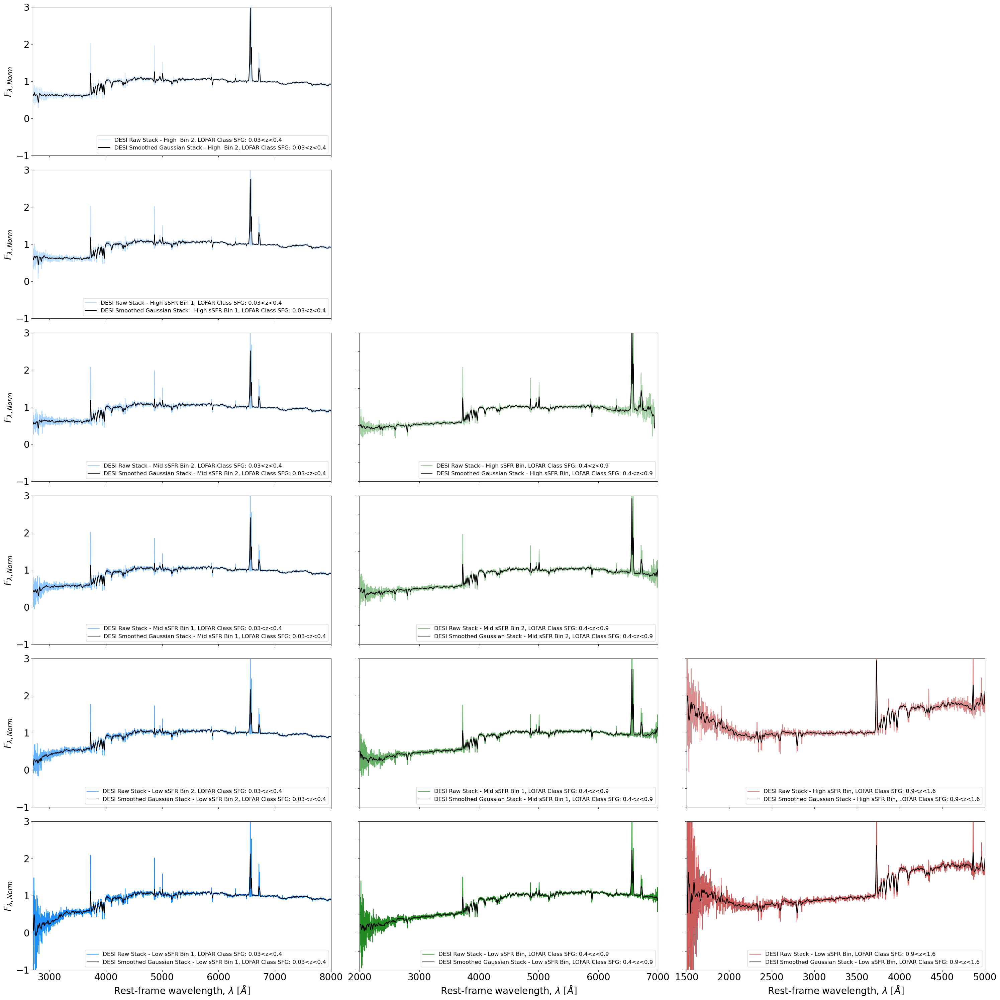

In [8]:
font = 20
# Plotting for zbin 1
fig, axes = plt.subplots(6, 3, figsize=(30, 30), sharex=False, sharey=False)

# Define the alpha values for each row
alpha_values = [0.2, 0.3, 0.4, 0.5, 0.7, 1.0][::-1]
labels_0 = ['Low sSFR Bin 1', 'Low sSFR Bin 2', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin 1', 'High  Bin 2']
labels_1 = ['Low sSFR Bin', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin']
labels_2 = ['Low sSFR Bin', 'High sSFR Bin']

for i in range(6):
    axes[5-i, 0].plot(zbin_1_wln[i], zbin_1_flux[i], 
                        label = f'DESI Raw Stack - {labels_0[i]}, LOFAR Class {Overall_class}: 0.03<z<0.4', color='dodgerblue', alpha=alpha_values[i])
    axes[5-i, 0].plot(zbin_1_wln[i], convolve(zbin_1_flux[i], Gaussian1DKernel(5)),
                        label = f'DESI Smoothed Gaussian Stack - {labels_0[i]}, LOFAR Class {Overall_class}: 0.03<z<0.4', color='black', alpha=1.0)
    axes[5-i, 0].set_xlabel('Rest-frame wavelength, $\lambda$ [$\AA$]', fontsize= font)
    axes[5-i, 0].set_ylabel('$F_{\lambda, Norm}$ ', fontsize= font)
    axes[5-i, 0].legend(fontsize=12, loc='lower right')
    axes[5-i, 0].set_xlim(2700, 8000)
    axes[5-i, 0].set_ylim(-1, 3)
    axes[5-i, 0].tick_params(axis='both', which='major', labelsize=font)  # Increase tick label size

# Plotting for zbin 2
for i in range(4):
    axes[5-i, 1].plot(zbin_2_wln[i], zbin_2_flux[i], 
                        label = f'DESI Raw Stack - {labels_1[i]}, LOFAR Class {Overall_class}: 0.4<z<0.9', color='forestgreen', alpha=alpha_values[i])
    axes[5-i, 1].plot(zbin_2_wln[i], convolve(zbin_2_flux[i], Gaussian1DKernel(5)),
                        label = f'DESI Smoothed Gaussian Stack - {labels_1[i]}, LOFAR Class {Overall_class}: 0.4<z<0.9', color='black', alpha=1.0)
    axes[5-i, 1].set_xlabel('Rest-frame wavelength, $\lambda$ [$\AA$]', fontsize= font)
    axes[5-i, 1].set_ylabel('$F_{\lambda, Norm}$ ', fontsize= font)
    axes[5-i, 1].legend(fontsize=12, loc='lower right')
    axes[5-i, 1].set_xlim(2000, 7000)
    axes[5-i, 1].set_ylim(-1, 3)
    axes[5-i, 1].tick_params(axis='both', which='major', labelsize=font)  # Increase tick label size

# Plotting for zbin 3
for i in range(2):
    axes[5-i, 2].plot(zbin_3_wln[i], zbin_3_flux[i], 
                        label = f'DESI Raw Stack - {labels_2[i]}, LOFAR Class {Overall_class}: 0.9<z<1.6', color='indianred', alpha=alpha_values[i])
    axes[5-i, 2].plot(zbin_3_wln[i], convolve(zbin_3_flux[i], Gaussian1DKernel(5)),
                        label = f'DESI Smoothed Gaussian Stack - {labels_2[i]}, LOFAR Class {Overall_class}: 0.9<z<1.6', color='black', alpha=1.0)
    axes[5-i, 2].set_xlabel('Rest-frame wavelength, $\lambda$ [$\AA$]', fontsize= font)
    axes[5-i, 2].set_ylabel('$F_{\lambda, Norm}$ ', fontsize= font)
    axes[5-i, 2].legend(fontsize=12, loc='lower right')
    axes[5-i, 2].set_xlim(1500, 5000)
    axes[5-i, 2].set_ylim(-1, 3)
    axes[5-i, 2].tick_params(axis='both', which='major', labelsize=font)  # Increase tick label size

# Remove x-axis label on all plots except row 5
for i in range(6):
    for j in range(3):
        if i != 5:
            axes[i, j].set_xlabel('')
            axes[i, j].tick_params(axis='x', which='both', labelsize=0)

# Remove y-axis label on all plots except column 0
for i in range(6):
    for j in range(3):
        if j != 0:
            axes[i, j].set_ylabel('')
            axes[i, j].tick_params(axis='y', which='both', labelsize=0)

# Delete rows 0, 1, 2, 3 in column 2
for i in range(4):
    fig.delaxes(axes[i, 2])

# Delete rows 0, 1 in column 1
for i in range(2):
    fig.delaxes(axes[i, 1])


plt.tight_layout()
plt.show()



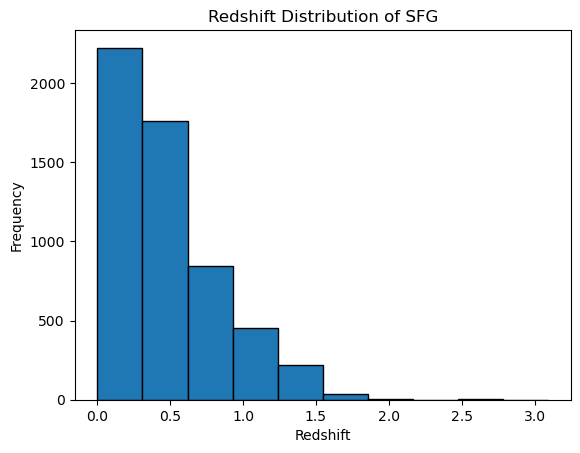

Number of SFG with Z > 0.9: 799


In [46]:
import matplotlib.pyplot as plt

# Filter the SFG data
sfg_data = crossmatch[crossmatch['Overall_class'] == 'SFG']

# Plot the histogram
plt.hist(sfg_data['Z'], bins=10, edgecolor='black')

# Add labels and title
plt.xlabel('Redshift')
plt.ylabel('Frequency')
plt.title('Redshift Distribution of SFG')

# Show the plot
plt.show()

# Filter the SFG data
sfg_data = crossmatch[crossmatch['Overall_class'] == 'SFG']

# Filter the SFG data with Z > 0.9
sfg_data_z_gt_0_9 = sfg_data[(sfg_data['Z'] > 0.9)&(sfg_data['Z'] < 3.5)]

# Get the count of SFG with Z > 0.9
count_sfg_z_gt_0_9 = len(sfg_data_z_gt_0_9)

# Print the count
print("Number of SFG with Z > 0.9:", count_sfg_z_gt_0_9)

In [23]:
#Z_bin 1



var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]


Overall_class = 'SFG'
crossmatch = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}']

zbin_1 = [0.03,0.4]

total_objects = len(crossmatch[(crossmatch['Z']>zbin_1[0]) & (crossmatch['Z'] < zbin_1[1])]) # should add the lower limit too
bins_1 = 5
table_size = total_objects // bins_1

# Create a list to store the tables
tables_1 = []

# Loop to create each table
for i in range(bins_1):
    start_index = i * table_size
    end_index = (i + 1) * table_size if i < bins_1 - 1 else total_objects
    
    # Create a table for the current segment
    current_table = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][start_index:end_index]
    
    # Append the table to the list
    tables_1.append(current_table)


# Create a list to store the stack outputs
spec_outputs_1 = []
stacks_outputs_1 = []

# Perform operations for each table
for i, table in enumerate(tables_1):
    search_column_name = 'TARGETID'
    search_values = np.array(table[f'{search_column_name}'])
    
    # Extract relevant spectra
    spec_1 = get_spectra(table, search_column_name, search_values)
    spec_outputs_1.append(spec_1)
    
    # Stack spectra - bin 1 
    stacks_1 = get_stack(spec_1, zbins=[zbin_1])

    # Append the stack output to the list
    stacks_outputs_1.append(stacks_1)


# Save the stack outputs to CSV files
for i, stacks in enumerate(stacks_outputs_1):
    
    stacks_df_1 = pd.DataFrame({'wave_spec_1': stacks['zbin=0']['wln'], 'flux_spec_1': stacks['zbin=0']['flux']})
    stacks_df_1.to_csv(f'{Overall_class}_sSFR_stacks_{i}_1.csv', index=False)

# Need to edit this so you get three different stack outputs one for each redshift bin
# This is so each can be ran for a different number of sSFR bins
# Do in the the same format as the svaing is done below for the three different redshift bins
    



Number of spectra = 612
INFO:spectra.py:372:read_spectra: iotime 2.900 sec to read coadd-sv3-bright-11521.fits at 2024-01-24T16:43:46.211249


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 1.421 sec to read coadd-sv3-bright-10152.fits at 2024-01-24T16:43:50.621378
INFO:spectra.py:372:read_spectra: iotime 2.397 sec to read coadd-sv3-bright-10150.fits at 2024-01-24T16:43:54.266287
INFO:spectra.py:372:read_spectra: iotime 3.316 sec to read coadd-sv3-bright-10156.fits at 2024-01-24T16:43:59.932795
INFO:spectra.py:372:read_spectra: iotime 2.985 sec to read coadd-sv3-bright-10158.fits at 2024-01-24T16:44:06.792369
INFO:spectra.py:372:read_spectra: iotime 1.838 sec to read coadd-sv3-bright-10154.fits at 2024-01-24T16:44:12.162639
INFO:spectra.py:372:read_spectra: iotime 0.140 sec to read coadd-sv3-bright-11522.fits at 2024-01-24T16:44:14.592813


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 0.608 sec to read coadd-sv3-backup-10153.fits at 2024-01-24T16:44:15.438229
INFO:spectra.py:372:read_spectra: iotime 2.581 sec to read coadd-sv3-bright-10153.fits at 2024-01-24T16:44:18.147993
INFO:spectra.py:372:read_spectra: iotime 0.768 sec to read coadd-sv3-bright-10157.fits at 2024-01-24T16:44:20.961846
INFO:spectra.py:372:read_spectra: iotime 2.064 sec to read coadd-sv3-bright-10153.fits at 2024-01-24T16:44:23.438099
INFO:spectra.py:372:read_spectra: iotime 2.961 sec to read coadd-sv3-bright-10156.fits at 2024-01-24T16:44:27.769781
INFO:spectra.py:372:read_spectra: iotime 0.881 sec to read coadd-sv1-other-10156.fits at 2024-01-24T16:44:32.106296
INFO:spectra.py:372:read_spectra: iotime 1.174 sec to read coadd-sv3-bright-10152.fits at 2024-01-24T16:44:33.690961
INFO:spectra.py:372:read_spectra: iotime 3.158 sec to read coadd-sv3-bright-10158.fits at 2024-01-24T16:44:37.195316
INFO:spectra.py:372:read_spectra: iotime 1.176 sec to read coadd-

/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 1.881 sec to read coadd-sv3-bright-11520.fits at 2024-01-24T16:44:48.512912
INFO:spectra.py:372:read_spectra: iotime 2.079 sec to read coadd-sv3-bright-10155.fits at 2024-01-24T16:44:51.239492
INFO:spectra.py:372:read_spectra: iotime 2.973 sec to read coadd-sv3-bright-11521.fits at 2024-01-24T16:44:56.615325
INFO:spectra.py:372:read_spectra: iotime 2.846 sec to read coadd-sv3-bright-10156.fits at 2024-01-24T16:45:01.516013
INFO:spectra.py:372:read_spectra: iotime 2.821 sec to read coadd-sv3-bright-10158.fits at 2024-01-24T16:45:07.697395
INFO:spectra.py:372:read_spectra: iotime 0.618 sec to read coadd-sv3-backup-10153.fits at 2024-01-24T16:45:10.401691
INFO:spectra.py:372:read_spectra: iotime 0.887 sec to read coadd-sv3-bright-11524.fits at 2024-01-24T16:45:11.652200
INFO:spectra.py:372:read_spectra: iotime 3.048 sec to read coadd-sv3-bright-10158.fits at 2024-01-24T16:45:14.916087
INFO:spectra.py:372:read_spectra: iotime 3.044 sec to read coadd

In [24]:
#zbin_2



var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]


Overall_class = 'SFG'
crossmatch = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}']


zbin_2 = [0.4,0.9]

total_objects = len(crossmatch[(crossmatch['Z']>zbin_2[0]) & (crossmatch['Z'] < zbin_2[1])])
bins_2 = 3
table_size = total_objects // bins_2

# Create a list to store the tables
tables_2 = []

# Loop to create each table
for i in range(bins_2):
    start_index = i * table_size
    end_index = (i + 1) * table_size if i < bins_2 - 1 else total_objects
    
    # Create a table for the current segment
    current_table = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][start_index:end_index]
    
    # Append the table to the list
    tables_2.append(current_table)

# Create a list to store the stack outputs
spec_outputs_2 = []
stacks_outputs_2 = []

# Perform operations for each table
for i, table in enumerate(tables_2):
    search_column_name = 'TARGETID'
    search_values = np.array(table[f'{search_column_name}'])
    
    # Extract relevant spectra
    spec_2 = get_spectra(table, search_column_name, search_values)
    spec_outputs_2.append(spec_2)
    
    # Stack spectra - bin 2
    stacks_2 = get_stack(spec_2, zbins=[zbin_2])

    # Append the stack output to the list
    stacks_outputs_2.append(stacks_2)

# Save the stack outputs to CSV files
for i, stacks in enumerate(stacks_outputs_2):
    
    stacks_df_2 = pd.DataFrame({'wave_spec_2': stacks['zbin=0']['wln'], 'flux_spec_2': stacks['zbin=0']['flux']})
    stacks_df_2.to_csv(f'{Overall_class}_sSFR_stacks_{i}_2.csv', index=False)

Number of spectra = 558
INFO:spectra.py:372:read_spectra: iotime 3.174 sec to read coadd-sv3-bright-11521.fits at 2024-01-25T13:52:16.977223


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 2.022 sec to read coadd-sv3-bright-10152.fits at 2024-01-25T13:52:20.027937
INFO:spectra.py:372:read_spectra: iotime 2.351 sec to read coadd-sv3-bright-10150.fits at 2024-01-25T13:52:24.412150
INFO:spectra.py:372:read_spectra: iotime 3.104 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T13:52:29.970829
INFO:spectra.py:372:read_spectra: iotime 3.179 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T13:52:35.964721
INFO:spectra.py:372:read_spectra: iotime 2.385 sec to read coadd-sv3-bright-10154.fits at 2024-01-25T13:52:41.191934
INFO:spectra.py:372:read_spectra: iotime 0.158 sec to read coadd-sv3-bright-11522.fits at 2024-01-25T13:52:44.051432


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 0.616 sec to read coadd-sv3-backup-10153.fits at 2024-01-25T13:52:44.941637
INFO:spectra.py:372:read_spectra: iotime 2.822 sec to read coadd-sv3-bright-10153.fits at 2024-01-25T13:52:47.887487
INFO:spectra.py:372:read_spectra: iotime 0.796 sec to read coadd-sv3-bright-10157.fits at 2024-01-25T13:52:51.077197
INFO:spectra.py:372:read_spectra: iotime 2.207 sec to read coadd-sv3-bright-10153.fits at 2024-01-25T13:52:53.675170
INFO:spectra.py:372:read_spectra: iotime 3.033 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T13:52:58.123674
INFO:spectra.py:372:read_spectra: iotime 0.871 sec to read coadd-sv1-other-10156.fits at 2024-01-25T13:53:02.538761
INFO:spectra.py:372:read_spectra: iotime 1.225 sec to read coadd-sv3-bright-10152.fits at 2024-01-25T13:53:04.167743
INFO:spectra.py:372:read_spectra: iotime 3.453 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T13:53:07.953469
INFO:spectra.py:372:read_spectra: iotime 1.419 sec to read coadd-

/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 3.005 sec to read coadd-sv3-bright-11520.fits at 2024-01-25T13:53:20.323132
INFO:spectra.py:372:read_spectra: iotime 2.093 sec to read coadd-sv3-bright-10155.fits at 2024-01-25T13:53:25.208915
INFO:spectra.py:372:read_spectra: iotime 3.219 sec to read coadd-sv3-bright-11521.fits at 2024-01-25T13:53:29.092896
INFO:spectra.py:372:read_spectra: iotime 3.225 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T13:53:35.050302
INFO:spectra.py:372:read_spectra: iotime 3.180 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T13:53:41.896787
INFO:spectra.py:372:read_spectra: iotime 0.604 sec to read coadd-sv3-backup-10153.fits at 2024-01-25T13:53:44.339339
INFO:spectra.py:372:read_spectra: iotime 0.980 sec to read coadd-sv3-bright-11524.fits at 2024-01-25T13:53:45.555853
INFO:spectra.py:372:read_spectra: iotime 2.965 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T13:53:48.803245
INFO:spectra.py:372:read_spectra: iotime 2.860 sec to read coadd

In [25]:
#zbin 3


var_bin = 'sSFR_cons'
crossmatch = crossmatch[np.array(np.argsort(crossmatch[f'{var_bin}']))]


Overall_class = 'SFG'
crossmatch = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}']


zbin_3 = [0.9,3.5]

total_objects = len(crossmatch[(crossmatch['Z']>zbin_3[0]) & (crossmatch['Z'] < zbin_3[1])])
bins_3 = 2
table_size = total_objects // bins_3

# Create a list to store the tables
tables_3 = []

# Loop to create each table
for i in range(bins_3):
    start_index = i * table_size
    end_index = (i + 1) * table_size if i < bins_3 - 1 else total_objects
    
    # Create a table for the current segment
    current_table = crossmatch[crossmatch['Overall_class'] == f'{Overall_class}'][start_index:end_index]
    
    # Append the table to the list
    tables_3.append(current_table)

# Create a list to store the stack outputs
spec_outputs_3 = []
stacks_outputs_3 = []

# Perform operations for each table
for i, table in enumerate(tables_3):
    search_column_name = 'TARGETID'
    search_values = np.array(table[f'{search_column_name}'])
    
    # Extract relevant spectra
    spec_3 = get_spectra(table, search_column_name, search_values)
    spec_outputs_3.append(spec_3)
    
    # Stack spectra - bin 3
    stacks_3 = get_stack(spec_3, zbins=[zbin_3])

    # Append the stack output to the list
    stacks_outputs_3.append(stacks_3)

# Save the stack outputs to CSV files
for i, stacks in enumerate(stacks_outputs_3):
    
    stacks_df_3 = pd.DataFrame({'wave_spec_3': stacks['zbin=0']['wln'], 'flux_spec_3': stacks['zbin=0']['flux']})
    stacks_df_3.to_csv(f'{Overall_class}_sSFR_stacks_{i}_3.csv', index=False)

Number of spectra = 399
INFO:spectra.py:372:read_spectra: iotime 2.690 sec to read coadd-sv3-bright-11521.fits at 2024-01-25T15:48:31.763409


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 1.584 sec to read coadd-sv3-bright-10152.fits at 2024-01-25T15:48:35.060954
INFO:spectra.py:372:read_spectra: iotime 2.472 sec to read coadd-sv3-bright-10150.fits at 2024-01-25T15:48:38.703485
INFO:spectra.py:372:read_spectra: iotime 3.186 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T15:48:43.997606
INFO:spectra.py:372:read_spectra: iotime 2.877 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T15:48:50.644189
INFO:spectra.py:372:read_spectra: iotime 2.162 sec to read coadd-sv3-bright-10154.fits at 2024-01-25T15:48:56.792849
INFO:spectra.py:372:read_spectra: iotime 0.142 sec to read coadd-sv3-bright-11522.fits at 2024-01-25T15:48:59.922047


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 0.585 sec to read coadd-sv3-backup-10153.fits at 2024-01-25T15:49:00.708507
INFO:spectra.py:372:read_spectra: iotime 2.206 sec to read coadd-sv3-bright-10153.fits at 2024-01-25T15:49:03.054521
INFO:spectra.py:372:read_spectra: iotime 1.680 sec to read coadd-sv3-bright-10157.fits at 2024-01-25T15:49:05.595292
INFO:spectra.py:372:read_spectra: iotime 2.064 sec to read coadd-sv3-bright-10153.fits at 2024-01-25T15:49:08.670191
INFO:spectra.py:372:read_spectra: iotime 4.225 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T15:49:13.422649
INFO:spectra.py:372:read_spectra: iotime 0.914 sec to read coadd-sv1-other-10156.fits at 2024-01-25T15:49:16.582753
INFO:spectra.py:372:read_spectra: iotime 1.242 sec to read coadd-sv3-bright-10152.fits at 2024-01-25T15:49:18.499490
INFO:spectra.py:372:read_spectra: iotime 2.658 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T15:49:21.462027
INFO:spectra.py:372:read_spectra: iotime 1.412 sec to read coadd-

/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 2.247 sec to read coadd-sv3-bright-11520.fits at 2024-01-25T15:49:33.977379
INFO:spectra.py:372:read_spectra: iotime 2.537 sec to read coadd-sv3-bright-10155.fits at 2024-01-25T15:49:38.548023
INFO:spectra.py:372:read_spectra: iotime 2.807 sec to read coadd-sv3-bright-11521.fits at 2024-01-25T15:49:43.421641
INFO:spectra.py:372:read_spectra: iotime 3.338 sec to read coadd-sv3-bright-10156.fits at 2024-01-25T15:49:47.645919
INFO:spectra.py:372:read_spectra: iotime 3.356 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T15:49:54.134112
INFO:spectra.py:372:read_spectra: iotime 0.644 sec to read coadd-sv3-backup-10153.fits at 2024-01-25T15:49:57.040933
INFO:spectra.py:372:read_spectra: iotime 0.912 sec to read coadd-sv3-bright-11524.fits at 2024-01-25T15:49:58.232959
INFO:spectra.py:372:read_spectra: iotime 3.286 sec to read coadd-sv3-bright-10158.fits at 2024-01-25T15:50:01.712977
INFO:spectra.py:372:read_spectra: iotime 2.773 sec to read coadd

ValueError: Maximum allowed size exceeded

In [45]:
spec_outputs_2[1]

(array([array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600. , 3600.8, 3601.6, ..., 9821.6, 9822.4, 9823.2]),
        array([3600. , 3600.8, 3601.6, ..., 9822.4, 9823.2, 9824. ]),
        array([3600.

In [ ]:
# Read stack.csv

stacks_outputs_1 = []
for i in range(bins_1):
    stacks_df_1 = pd.read_csv(f'{Overall_class}_stacks_{i}_1.csv')
    stacks_1 = (stacks_df_1['wave_spec_1'].values, stacks_df_1['flux_spec_1'].values)
    stacks_outputs_1.append(stacks_1)

stacks_outputs_2 = []
for i in range(bins_2):
    stacks_df_2 = pd.read_csv(f'{Overall_class}_stacks_{i}_2.csv')
    stacks_2 = (stacks_df_2['wave_spec_2'].values, stacks_df_2['flux_spec_2'].values)
    stacks_outputs_2.append(stacks_2)

stacks_outputs_3 = []
for i in range(bins_3):
    stacks_df_3 = pd.read_csv(f'{Overall_class}_stacks_{i}_3.csv')
    stacks_3 = (stacks_df_3['wave_spec_3'].values, stacks_df_3['flux_spec_3'].values)
    stacks_outputs_3.append(stacks_3)

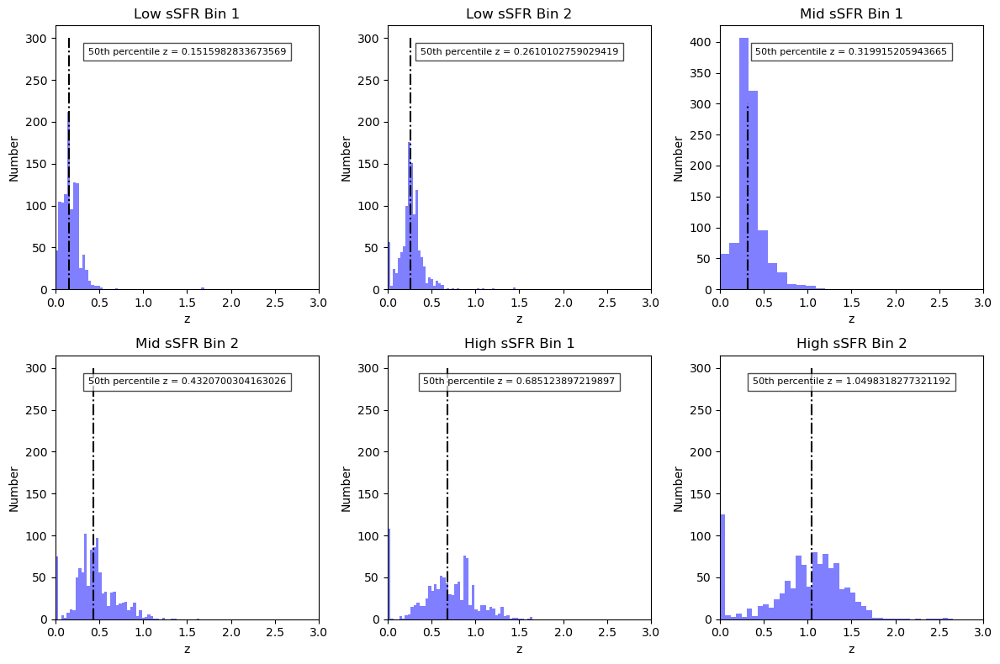

In [9]:




labels = ['Low sSFR Bin 1', 'Low sSFR Bin 2', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin 1', 'High sSFR Bin 2']



num_tables = len(tables)
num_rows = 2
num_cols = 3
percentile = 50

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))  # Adjust the figure size as needed

for i, (table, label) in enumerate(zip(tables,labels)):
    z_cut = np.percentile(table['Z'],percentile)
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]

    ax.hist(table['Z'], bins=50, color='blue', alpha=0.5)
    ax.set_xlabel('z')
    ax.set_ylabel('Number')
    ax.set_title(f'{label}')
    ax.set_xlim(0,3)
    ax.vlines(z_cut,0,300, colors = 'black', linestyles='-.')
    #ax.set_ylim(0,300)

    # Add label at the specified position
    ax.text(0.5, 0.9, f'{percentile}th percentile z = {z_cut}', transform=ax.transAxes, ha='center', va='center', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))

# Adjust layout for better spacing
plt.tight_layout()
plt.show()




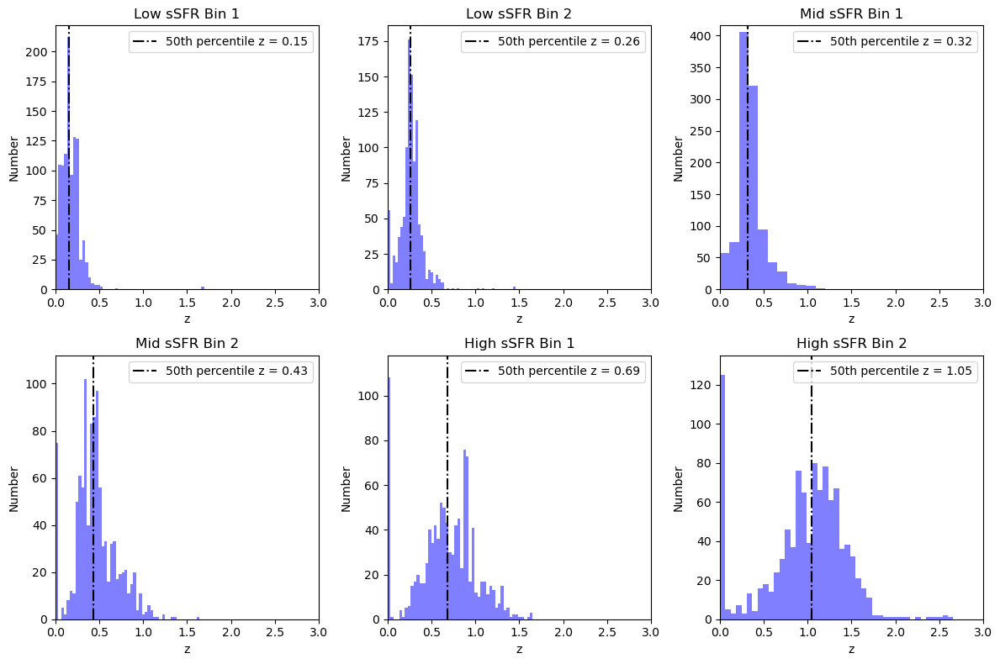

In [10]:


labels = ['Low sSFR Bin 1', 'Low sSFR Bin 2', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin 1', 'High sSFR Bin 2']

num_tables = len(tables)
num_rows = 2
num_cols = 3
percentile = 50

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))  # Adjust the figure size as needed

for i, (table, label) in enumerate(zip(tables, labels)):
    z_cut = np.percentile(table['Z'], percentile)
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx]

    counts, bins, _ = ax.hist(table['Z'], bins=50, color='blue', alpha=0.5)
    ax.set_xlabel('z')
    ax.set_ylabel('Number')
    ax.set_title(f'{label}')
    ax.set_xlim(0, 3)
    
    # Set y-limit to the maximum value in the histogram
    ax.set_ylim(0, max(counts)+10)
    
    ax.vlines(z_cut, ymin=0, ymax=max(counts)+10, colors='black', linestyles='-.', label = f'{percentile}th percentile z = {z_cut:.2f}')
    ax.legend()
    
# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [11]:
# Create a list to store the stack outputs
stacks_outputs = []

# Perform operations for each table
for i, table in enumerate(tables):
    search_column_name = 'TARGETID'
    search_values = np.array(table[f'{search_column_name}'])
    
    # Extract relevant spectra
    spec = get_spectra(table, search_column_name, search_values)
    
    # Stack spectra
    stacks = get_stack(spec, zbins=[[-0.5,0.75],[0.75,4.5]])

    # Append the stack output to the list
    stacks_outputs.append(stacks)

Number of spectra = 1049
INFO:spectra.py:372:read_spectra: iotime 3.215 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T16:56:32.773718


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3482820004.py:79: RuntimeWarning: divide by zero encountered in divide
  sigma = (np.sqrt(1/coadd_spec.ivar['r']))


INFO:spectra.py:372:read_spectra: iotime 1.533 sec to read coadd-sv3-bright-10152.fits at 2024-01-22T16:56:36.465081
INFO:spectra.py:372:read_spectra: iotime 2.577 sec to read coadd-sv3-bright-11521.fits at 2024-01-22T16:56:40.427275
INFO:spectra.py:372:read_spectra: iotime 2.530 sec to read coadd-sv3-bright-10150.fits at 2024-01-22T16:56:43.728523
INFO:spectra.py:372:read_spectra: iotime 2.546 sec to read coadd-sv3-bright-10155.fits at 2024-01-22T16:56:48.811779


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:7: RuntimeWarning: divide by zero encountered in divide
  weight2 = 1 / ivar2
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:10: RuntimeWarning: invalid value encountered in divide
  weighted_flux2 = flux2 * (weight2 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 1.963 sec to read coadd-sv3-bright-10155.fits at 2024-01-22T16:56:53.778794
INFO:spectra.py:372:read_spectra: iotime 3.172 sec to read coadd-sv3-bright-10156.fits at 2024-01-22T16:56:59.097648
INFO:spectra.py:372:read_spectra: iotime 0.504 sec to read coadd-sv3-backup-11520.fits at 2024-01-22T16:57:02.736887


/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:6: RuntimeWarning: divide by zero encountered in divide
  weight1 = 1 / ivar1
/var/folders/wq/x4d7t0dd705bwvpnmkf6s7s40000gn/T/ipykernel_21016/3924121423.py:9: RuntimeWarning: invalid value encountered in divide
  weighted_flux1 = flux1 * (weight1 / total_weight)


INFO:spectra.py:372:read_spectra: iotime 1.773 sec to read coadd-sv3-bright-11520.fits at 2024-01-22T16:57:04.766360
INFO:spectra.py:372:read_spectra: iotime 2.857 sec to read coadd-sv3-bright-10158.fits at 2024-01-22T16:57:08.125677
INFO:spectra.py:372:read_spectra: iotime 2.074 sec to read coadd-sv3-bright-10154.fits at 2024-01-22T16:57:12.939652
INFO:spectra.py:372:read_spectra: iotime 0.213 sec to read coadd-sv3-bright-11522.fits at 2024-01-22T16:57:14.420747
INFO:spectra.py:372:read_spectra: iotime 0.180 sec to read coadd-sv1-other-11524.fits at 2024-01-22T16:57:14.750433
INFO:spectra.py:372:read_spectra: iotime 0.584 sec to read coadd-sv3-backup-10153.fits at 2024-01-22T16:57:15.384553
INFO:spectra.py:372:read_spectra: iotime 2.630 sec to read coadd-sv3-bright-10150.fits at 2024-01-22T16:57:18.144685
INFO:spectra.py:372:read_spectra: iotime 2.799 sec to read coadd-sv3-bright-10153.fits at 2024-01-22T16:57:22.531545
INFO:spectra.py:372:read_spectra: iotime 0.751 sec to read coadd-

## Plot Stacked Spectra

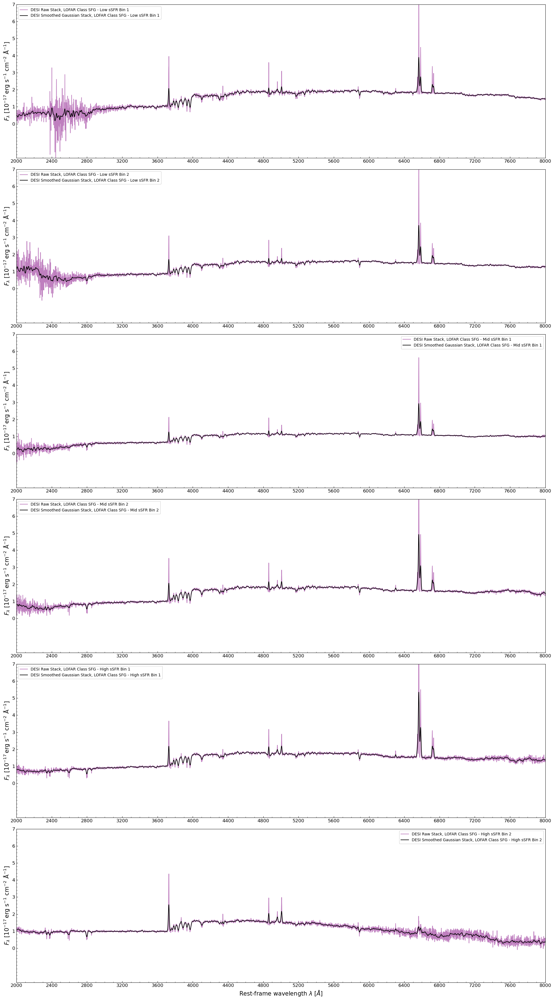

In [12]:
# Create a figure with three subplots
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(20, 36), sharey=True)

#label = f'DESI Raw Stack - LOFAR Classification {Overall_class}'
#, label = f'DESI Smoothed Gaussian Stack - LOFAR Classification {Overall_class}'

# Change to mass
# Define the labels for the legend
labels = ['Low sSFR Bin 1', 'Low sSFR Bin 2', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin 1', 'High sSFR Bin 2']

# Loop over each stack output and plot in a separate subplot
for i, (stack_output, label) in enumerate(zip(stack_outputs, labels)):
    ax = axes[i]  # Select the current subplot
    
    # Plot the stacked spectra
    ax.plot(stack_output['zbin=0']['wln'], stack_output['zbin=0']['flux'], color='purple', alpha=0.5,
            label=f'DESI Raw Stack, LOFAR Class {Overall_class} - {label}')
    
    # Plot the convolved spectra
    ax.plot(stack_output['zbin=0']['wln'], convolve(stack_output['zbin=0']['flux'], Gaussian1DKernel(5)),
            color='black', alpha=1, label = f'DESI Smoothed Gaussian Stack, LOFAR Class {Overall_class} - {label}')
    
    if i == len(stack_outputs) - 1:
        ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]', fontsize=15)

    ax.set_ylabel('$F_{\lambda}$ [$10^{-17} \, \mathrm{erg\ s^{-1}\ cm^{-2}\ \AA^{-1}}$]')
    #ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]')
    ax.set_ylim(-2, 6)
    ax.set_xlim(2000, 8000)
    ax.set_xticks(range(2000, 8001, 400))
    ax.set_yticks(range(0, 8, 1))
    ax.tick_params(axis='both', which='both', labelsize=12, direction = 'in')
    ax.minorticks_on()
    ax.xaxis.label.set_size(15)
    ax.yaxis.label.set_size(15)
    ax.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()




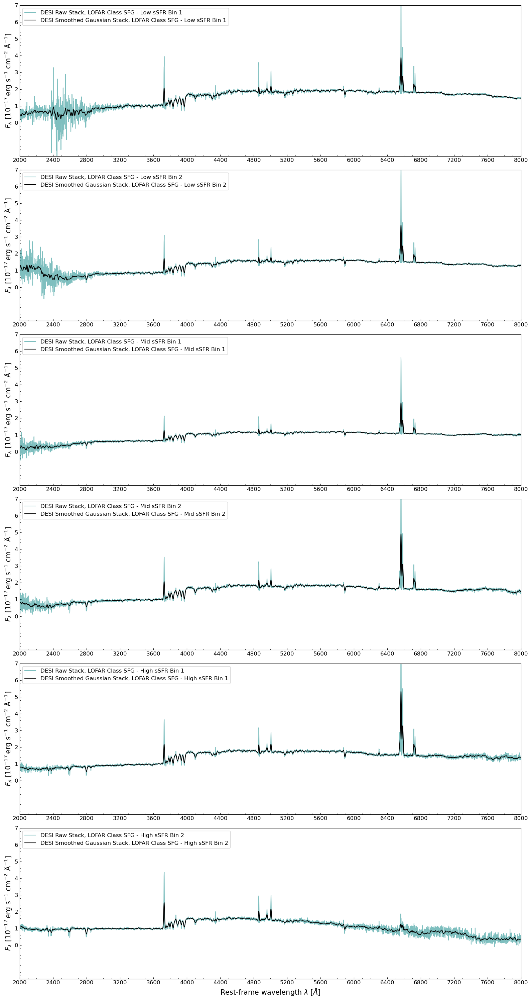

All plots saved in DESI-SFG-stacks-sSFR.pdf


In [13]:
from matplotlib.backends.backend_pdf import PdfPages


# Create a PDF file to save the plots
pdf_filename = f'DESI-{Overall_class}-stacks-sSFR.pdf'
with PdfPages(pdf_filename) as pdf:
        # Create a figure with three subplots
        fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(16, 30), sharey=True)

        #label = f'DESI Raw Stack - LOFAR Classification {Overall_class}'
        #, label = f'DESI Smoothed Gaussian Stack - LOFAR Classification {Overall_class}'

        # Change to mass
        # Define the labels for the legend
        labels = ['Low sSFR Bin 1', 'Low sSFR Bin 2', 'Mid sSFR Bin 1', 'Mid sSFR Bin 2', 'High sSFR Bin 1', 'High sSFR Bin 2']

        # Loop over each stack output and plot in a separate subplot
        for i, (stack_output, label) in enumerate(zip(stack_outputs, labels)):
                ax = axes[i]  # Select the current subplot
        
                # Plot the stacked spectra
                ax.plot(stack_output['zbin=0']['wln'], stack_output['zbin=0']['flux'], color='teal', alpha=0.5,
                        label=f'DESI Raw Stack, LOFAR Class {Overall_class} - {label}')
                
                # Plot the convolved spectra
                ax.plot(stack_output['zbin=0']['wln'], convolve(stack_output['zbin=0']['flux'], Gaussian1DKernel(5)),
                        color='black', alpha=1, label = f'DESI Smoothed Gaussian Stack, LOFAR Class {Overall_class} - {label}')
                
                if i == len(stack_outputs) - 1:
                        ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]', fontsize=15)

                ax.set_ylabel('$F_{\lambda}$ [$10^{-17} \, \mathrm{erg\ s^{-1}\ cm^{-2}\ \AA^{-1}}$]')
                #ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]')
                ax.set_ylim(-2, 6)
                ax.set_xlim(2000, 8000)
                ax.set_xticks(range(2000, 8001, 400))
                ax.set_yticks(range(0, 8, 1))
                ax.tick_params(axis='both', which='both', labelsize=12, direction = 'in')
                ax.minorticks_on()
                ax.xaxis.label.set_size(15)
                ax.yaxis.label.set_size(15)
                ax.legend(fontsize= 'large', loc='upper left')

                # Adjust layout for better spacing
                plt.tight_layout()

        # Save the current plot to the PDF file
        pdf.savefig(fig)
# Show the plot
plt.show()
plt.close()

# All the plots will be saved in the PDF file
print(f'All plots saved in {pdf_filename}')



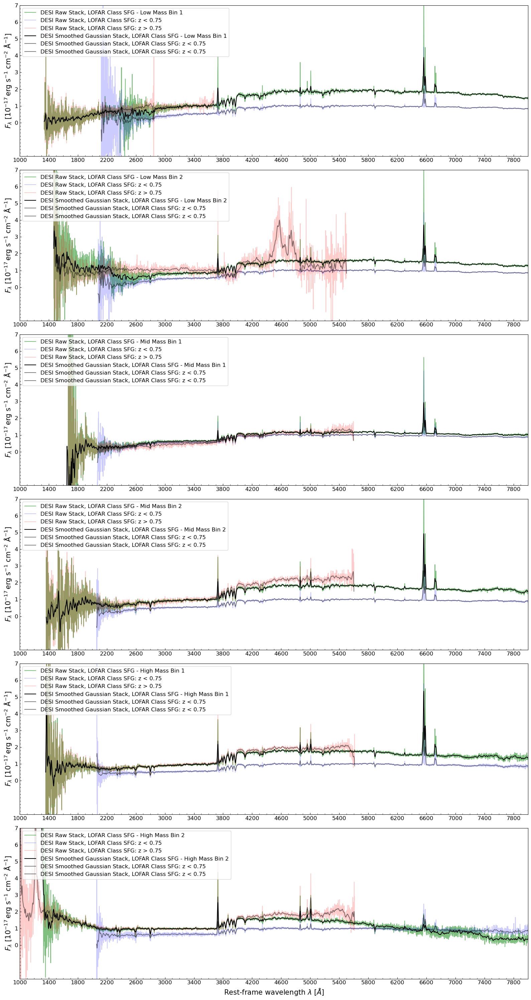

All plots saved in DESI-SFG-stack-mass.pdf


In [14]:
"""
Splitting by reshift recovers Halpha but could still split different bins
(see histograms for where the difference in the redshift bins lies)
computationally longggg though maybe try loop out the get spectra function from the stacks function

st0 = bounds(SFG_stacks['zbin=0']['wln'])
st1 = bounds(SFG_stacks['zbin=1']['wln'])
st2 = bounds(SFG_stack['zbin=0']['wln'])


"""

#CHANGE TO sSFR ??

# Create a PDF file to save the plots
pdf_filename = f'DESI-{Overall_class}-stack-mass.pdf'
with PdfPages(pdf_filename) as pdf:
        # Create a figure with three subplots
        fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(16, 30), sharey=True)

        


        # Change to mass
        # Define the labels for the legend
        labels = ['Low Mass Bin 1', 'Low Mass Bin 2', 'Mid Mass Bin 1', 'Mid Mass Bin 2', 'High Mass Bin 1', 'High Mass Bin 2']

        # Loop over each stack output and plot in a separate subplot
        for i, (stack_output, stacks_output,label) in enumerate(zip(stack_outputs,stacks_outputs, labels)):
                ax = axes[i]  # Select the current subplot
        
                # Plot the stacked spectra
                ax.plot(stack_output['zbin=0']['wln'], stack_output['zbin=0']['flux'], color='green', alpha=0.5,
                        label=f'DESI Raw Stack, LOFAR Class {Overall_class} - {label}')
                ax.plot(stacks_output['zbin=0']['wln'],stacks_output['zbin=0']['flux'], 
                        label = f'DESI Raw Stack, LOFAR Class {Overall_class}: z < 0.75', color='blue', alpha=0.2)
                ax.plot(stacks_output['zbin=1']['wln'],stacks_output['zbin=1']['flux'], 
                        label = f'DESI Raw Stack, LOFAR Class {Overall_class}: z > 0.75', color='red', alpha=0.2)
        
                
                # Plot the convolved spectra
                ax.plot(stack_output['zbin=0']['wln'], convolve(stack_output['zbin=0']['flux'], Gaussian1DKernel(5)),
                        color='black', alpha=1, label = f'DESI Smoothed Gaussian Stack, LOFAR Class {Overall_class} - {label}')
                ax.plot(stacks_output['zbin=0']['wln'],convolve(stacks_output['zbin=0']['flux'], Gaussian1DKernel(5)), 
                        color='black', alpha=0.5, label = f'DESI Smoothed Gaussian Stack, LOFAR Class {Overall_class}: z < 0.75')
                ax.plot(stacks_output['zbin=1']['wln'],convolve(stacks_output['zbin=1']['flux'], Gaussian1DKernel(5)), 
                        color='black', alpha=0.5, label = f'DESI Smoothed Gaussian Stack, LOFAR Class {Overall_class}: z < 0.75')
        



                if i == len(stack_outputs) - 1:
                        ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]', fontsize=15)

                ax.set_ylabel('$F_{\lambda}$ [$10^{-17} \, \mathrm{erg\ s^{-1}\ cm^{-2}\ \AA^{-1}}$]')
                #ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]')
                ax.set_ylim(-2, 6)
                ax.set_xlim(1000, 8000)
                ax.set_xticks(range(1000, 8001, 400))
                ax.set_yticks(range(0, 8, 1))
                ax.tick_params(axis='both', which='both', labelsize=12, direction = 'in')
                ax.minorticks_on()
                ax.xaxis.label.set_size(15)
                ax.yaxis.label.set_size(15)
                ax.legend(fontsize='large', loc ='upper left')

                # Adjust layout for better spacing
                plt.tight_layout()
                
                
                
               
        # Save the current plot to the PDF file
        pdf.savefig(fig)
# Show the plot
plt.show()
plt.close()

# All the plots will be saved in the PDF file
print(f'All plots saved in {pdf_filename}')


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from astropy.convolution import convolve, Gaussian1DKernel

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(20, 36), sharex=True, sharey=True)

# Change to mass
# Define the labels for the legend
labels = ['SFG Low SFR Bin 1', 'SFG Low SFR Bin 2', 'SFG Mid SFR Bin 1', 'SFG Mid SFR Bin 2', 'SFG High SFR Bin 1', 'SFG High SFR Bin 2']

# Loop over each stack output and plot in a separate subplot
for i, (stack_output, label) in enumerate(zip(stack_outputs, labels)):
    ax = axes[i]  # Select the current subplot
    
    # Plot the stacked spectra
    ax.plot(stack_output['zbin=0']['wln'], stack_output['zbin=0']['flux'], color='purple', alpha=0.5,
            label=f'DESI {label} Stacked Spectra')
    
    # Plot the convolved spectra
    ax.plot(stack_output['zbin=0']['wln'], convolve(stack_output['zbin=0']['flux'], Gaussian1DKernel(5)),
            color='black', alpha=1)
    
    ax.set_ylabel('$F_{\lambda}$ [$10^{-17} \, \mathrm{erg\ s^{-1}\ cm^{-2}\ \AA^{-1}}$]', fontsize=15)
    
    # Set x-axis label only for the bottom subplot
    if i == len(stack_outputs) - 1:
        ax.set_xlabel('Rest-frame wavelength $\lambda$ [$\AA$]', fontsize=15)
    
    ax.set_ylim(-2, 6)
    ax.set_xlim(2000, 8500)
    ax.set_xticks(range(1200, 8001, 400))
    ax.set_yticks(range(0, 8, 1))
    ax.tick_params(axis='both', which='both', labelsize=12, direction='in')
    ax.minorticks_on()

    # Increase the size and font size of the legend
    ax.legend(fontsize='large')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()
